# Clase 04: Datos Vectoriales y Geopandas

------

## Objetivos de esta Clase:

En esta clase vamos a aprender a usar la librería Geopandas, que nos permite manipular con mayor facilidad datos vectoriales. También la combinaremos con Rasterio para el tratamiento combinado de información raster y vectorial. Los objetivos que se esperan cubrir luego de finalizar esta clase son:

- [x]  Aprender a procesar datos geoespaciales vectoriales: su lectura, interpretación y escritura.  
- [x]  Realizar operaciones básicas de superposición espacial (visualización conjunta y recortes) entre datos vectoriales y raster.
- [X]  Realizar reproyecciones, tanto de datos ráster como vectoriales.

### Datos con los que trabajaremos en esta Notebook:

- Capa vectorial de radios censales correspondiente al Censo Nacional de Población y Vivienda 2010, disponibles en el siguiente [enlace](https://drive.google.com/file/d/1w3RhgJvc2E9FyPEMTE5eX10cq_qlMNFy/view?usp=sharing).
- Capa vectorial del Río Suquía (Córdoba), disponible en este [enlace](https://drive.google.com/file/d/1xdFmwzVPDKPE6VILlH6V1imxvMKFSycv/view?usp=sharing).
- Capa vectorial de la red de accesos a Córdoba, disponible en este [enlace](https://drive.google.com/file/d/1OtACjuerQO7OZvi1l5ZhLr1y1oC-0kQc/view?usp=sharing).  
- Recorte de una imagen Sentinel-2 cubriendo la misma zona de las escenas SPOT trabajadas en las clases 02 y 03, disponible en este [enlace](https://drive.google.com/file/d/1nRhwQKShMPGnZCBqCjO6Q-6tg5kntMD9/view?usp=sharing).

En el caso de las capas vectoriales, descargá los archivos .ZIP y descomprimilos en la carpeta `data`. Lo mismo con el archivo GeoTiff de la imagen Sentinel-2-

## 1. Vectores y geopandas

A diferencia del modelo raster, en el modelo vectorial los datos no se organizan como una matriz, sino que adoptan la representación de elementos geométricos básicos como los puntos, las líneas o los polígonos. El elemento vectorial base es el punto; varios puntos unidos por segmentos definen una línea; y varias líneas y puntos se usan para definir polígonos. 

Esta estructura impacta directamente en la forma en que estos elementos se pueden leer con Python. Hay muchas operaciones que vimos con las imágenes que no podemos aplicar sobre los vectores (como hacer _slicing_ de un aarreglo o el álgebra entre bandas). Sin embargo, la estructura y disposición de los datos vectoriales permiten hacer otros análisis que no son tan directos sobre los archivos raster. Un poco de todo esto repasaremos en las siguientes secciones.

Existen muchas librerías de Python que nos permiten trabajar con datos vectoriales: Nosotros trabajaremos con una llamada **Geopandas**.

Geopandas es una extension de la librería Pandas que nos permite trabajar con datos geoespaciales. Para ello toma elementos de otras librerías especialiazadas como **[shapely](https://shapely.readthedocs.io/en/stable/project.html)** para realizar operaciones geométricas, y **[fiona](https://fiona.readthedocs.io/en/latest/manual.html)** para acceder y/o modificar los archivos. Es decir, se trata de un paquete de funcionalidades de alto nivel.

### 1.1. Estructura de datos en Geopandas

Geopandas maneja dos tipos de estructuras de datos: _Geoseries_ y _Geodataframes_.  Estos son subclases de las Series y los Dataframes que maneja Pandas.

Una _Geoseries_ es la estructura elemental en geopandas. Se trata de un vector donde cada una de esas entradas comprende una o más formas o elementos geométricos. Cada uno de estos registros puede constar de una sola geometría (por ejemplo los polígonos de una capa de barrios de una ciudad) o muchas geometrías (por ejemplo, para representar un archipiélago se usan varios polígonos donde cada uno representa una isla):

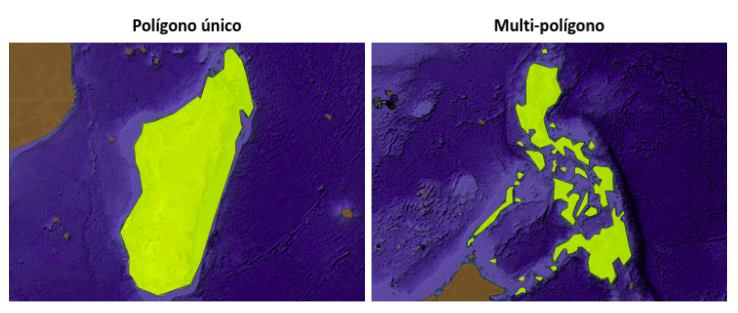

Las _Geoseries_ se pueden manipular como objetos de [Shapely](https://pypi.org/project/Shapely/), lo cual otorga un gran abanico de opciones. Todo el procesamiento geométrico que nos permite GeoPandas descansa sobre las capacidades que le otorga Shapely. 

Los _Geodataframes_ tienen una estructura tabular y contienene una o más _Geoseries_, que representan cada una de las columnas de dicha tabla. Lo importante aquí es entender que dentro de un _Geodataframe_ siempre habrá una columna especial especial sobre la que se pueden hacer las operaciones geométricas. Esta columna normalmente es indicada como la geometría o _geometry_ , aunque su nombre identificatorio no sea exactamente ese:

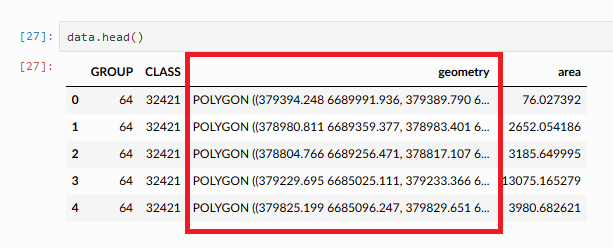

A continuación veremos algunos ejemplos de los principales métodos que podemos usar con un _Geodataframe_. Leeremos con Geopandas el archivo **radios_recorte_cordoba.shp** que contiene los radios censales. El método de Geopandas para abrir archivos vectoriales es **[read_file](https://geopandas.org/docs/reference/api/geopandas.read_file.html)**:

```python
import geopandas as gpd
from matplotlib import pyplot as plt
import numpy as np
import funciones as fn

radios = gpd.read_file('data/radios_recorte_cordoba.shp')

# Visualizar las primeras 5 filas
radios.head(5)
```

In [1]:
import geopandas as gpd
from matplotlib import pyplot as plt
import numpy as np
import funciones as fn

In [2]:
radios = gpd.read_file('data/radios_recorte_cordoba/radios_recorte_cordoba.shp')
# Visualizar las primeras 5 filas
radios.head(5)

,id,link,totalpobl,area_radio,geometry
0,3413,140143114,337.0,44710.301,"POLYGON ((4390390.528 6528633.88, 4390601.309 ..."
1,3414,140143113,449.0,61036.640,"POLYGON ((4390601.309 6528633.88, 4390806.637 ..."
2,3147,140145207,664.0,64648.964,"POLYGON ((4389886.868 6525037.977, 4390034.974..."
3,2282,140148013,1.0,264.768,"POLYGON ((4388821.315 6522694.542, 4388821.315..."
4,2301,140147816,206.0,37421.025,"POLYGON ((4389560.402 6522694.542, 4389290.007..."


Si imprimimos el tipo de dato de _radios_, Python nos dirá que se trata de un `GeoDataFrame`de Geopandas:

```python
print(type(radios))
```

In [4]:
print(type(radios))

<class 'geopandas.geodataframe.GeoDataFrame'>


### 1.2. Atributos y operaciones básicas

Como dijimos mas arriba, sobre la geometría se pueden consultar ciertos atributos. Algunos de los mas comunes son:

- area : Devuelve el área de cada uno de los elementos geométricos
- crs : Devuelve la descripción del Sistema de Coordenadas en que se encuentra el vector
- bounds: Devuelve la extensión (Norte/Sur/Este/Oeste) de cada uno de los elementos geométricos
- total_bounds: Devuelve la extensión total de la capa (algo así como el _extent_ que nos da QGIS)
- geom_type: Nos devuelve el tipo de geometría

Algunos ejemplos:

```python
print('Extensión total:',radios.total_bounds)

print('Área de cada elemento: \n',round(radios.area,2))

print('Sistema de coordenadas:',radios.crs)
```

In [5]:
print('Extensión total:',radios.total_bounds)

print('Área de cada elemento: \n',round(radios.area,2))

print('Sistema de coordenadas:',radios.crs)

Extensión total: [4388821.31452581 6522694.54183773 4399635.16936775 6528633.88007303]
Área de cada elemento: 
 0       44746.09
1       61085.50
2       64700.71
3         264.98
4       37450.98
         ...    
262      5060.10
263    918189.02
264     63290.67
265     60587.44
266    169728.48
Length: 267, dtype: float64
Sistema de coordenadas: EPSG:5346


Además de los atributos, también existen métodos como  `_.plot()_` que nos permiten visualizar la capa. Plot hereda casi todas las propiedades de `pyplot` (Matplotlib), con lo cual los parámetros para configurarlo son muy similares.

```python
radios.plot(figsize = (20,10))
```

<Axes: >

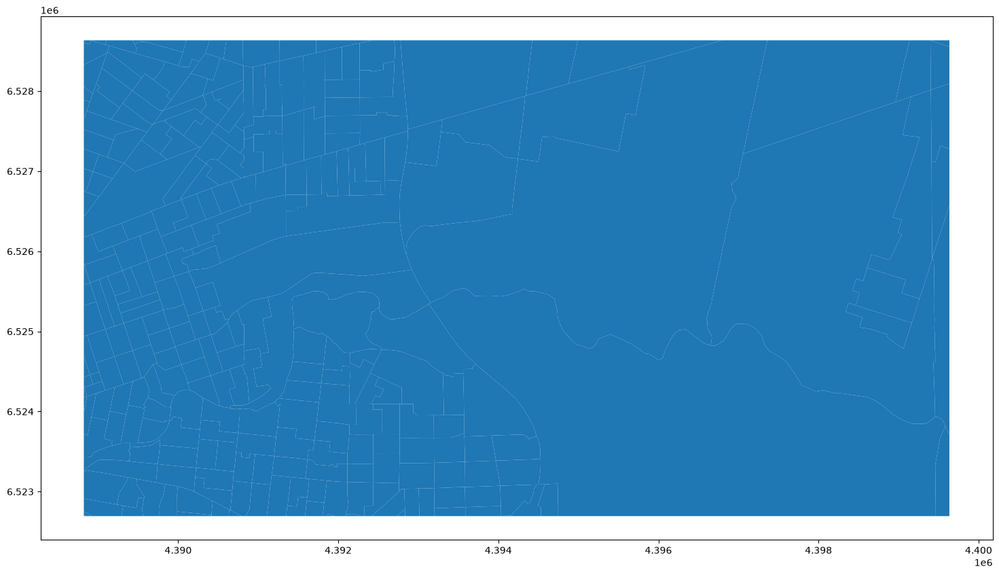

In [6]:
radios.plot(figsize = (20,10))

Los radios censales son unidades que se definen para relevar el territorio cada vez que se realiza un Censo de Población y Vivienda. En Argentina los responsables de generar la cartografía censal son el INDEC y las Direcciones Provinciales de Estadística. En este [link](https://sitioanterior.indec.gob.ar/codgeo.asp) se pueden descargar las capas vectoriales con radios censales para todo el país. Los radios se agrupan en fracciones censales, que a su vez forman parte de un departamento y una provincia específico.


Cuando hicimos la consulta con _.columns_ , encontramos los siguientes atributos dentro de radios:

- ID: Es un identificador único de cada elemento que se genera al importarlo como Geodataframe
- Link: Es la clave censal que permite identificar al radio. En el mismo se especifica la provincia, el departamento, la fracción y el radio censal.
- Totalpobl: El total de personas de ese radio censal
- Area_radio: La superficie del radio censal en m2
- Geometry: La columna de geometría

Supongamos que queremos cambiarles los nombres a estas columnas y ponerles otros con los que estemos más cómodos. La forma más simple de especificarlos es utilizando la estructura de los diccionarios de datos, que ya vimos en la Clase 03:

```python
#Definimos un diccionario para mapear los nombres actuales a nombres nuevos:
nombres_col  = {'link': 'codigo', 'totalpobl': 'personas', 'area_radio': 'sup_m2'}

#Renombramos usando el diccionario anterior:
radios.rename(columns = nombres_col, inplace = True)

radios.head()
```

In [3]:
#Definimos un diccionario para mapear los nombres actuales a nombres nuevos:
nombres_col  = {'link': 'codigo', 'totalpobl': 'personas', 'area_radio': 'sup_m2'}

#Renombramos usando el diccionario anterior:
radios.rename(columns = nombres_col, inplace = True)

radios.head()

,id,codigo,personas,sup_m2,geometry
0,3413,140143114,337.0,44710.301,"POLYGON ((4390390.528 6528633.88, 4390601.309 ..."
1,3414,140143113,449.0,61036.640,"POLYGON ((4390601.309 6528633.88, 4390806.637 ..."
2,3147,140145207,664.0,64648.964,"POLYGON ((4389886.868 6525037.977, 4390034.974..."
3,2282,140148013,1.0,264.768,"POLYGON ((4388821.315 6522694.542, 4388821.315..."
4,2301,140147816,206.0,37421.025,"POLYGON ((4389560.402 6522694.542, 4389290.007..."


Las columnas se renombraron correctamente. Supongamos ahora que queremos crear una columna que tenga el área en km2 en lugar de m2. Para ello podemos dividir la columna `sup_m2` por 1e6 (1 millón), o dividir por 1e6 la salida del atributo .area: 

```python
#Opción 1: 

print(radios['sup_m2'] / 1e6)

#Opción 2:
print(radios.area / 1e6)
```

La forma de crear una nueva columna, es exactamente igual a la de un Datframe de pandas:

```python
radios['sup_km2'] = radios.area / 1e6
radios.head()
```

Si queremos cambiar el orden de las columnas, podemos generar una lista replicando sus nombres en la secuencia deseada, y redefinir el dataframe con ese orden:

```python
#Imprimo la lista actual de columnas (esto es solo como ayuda):

print(list(radios.columns))

# Defino una lista con el orden nuevo:

cols = ['id', 'codigo', 'personas', 'sup_m2','sup_km2', 'geometry']

# Redefino el geodataframe con el nuevo orden:
radios = radios[cols]
print(radios)
```

 **Nota:** En la celda anterior, hemos regenerado el `geodataframe` con el orden especificado. A no ser que estemos muy seguros del cambio, nos conviene siempre trabajar con copias del elemento original.

Guardamos nuestro Geodataframe modificado como archivo de extensión .SHP, en la misma carpeta donde guardamos los archivos de la Clase 03: **output**:

```python
radios.to_file('output/radios_clase04.shp')
```

Si lo abrimos en QGIS, podemos corroborar que los atributos reflejan las modificaciones realizadas:

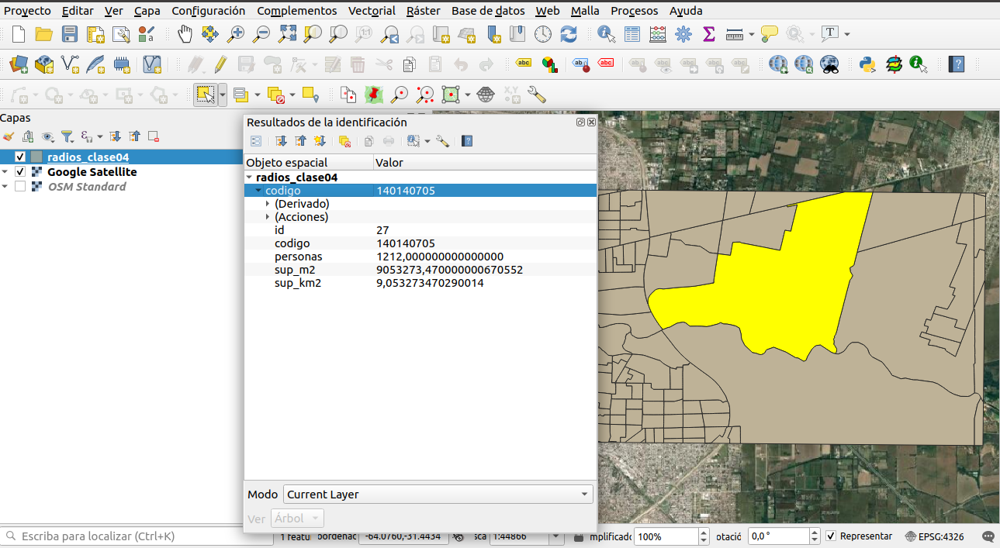

Y en nuestra carpeta se deberán haber generado los ficheros que acompañan normalmente al shape:

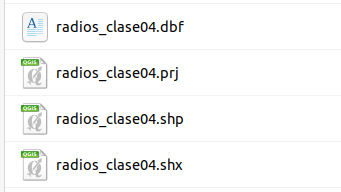

#### Una alternativa: El formato GeoPackage

Si bien hasta ahora hemos desarrollado todos nuestros ejmplos con el formato shapefile, que es el más tradicional y difundido dentro de los datos vectoriales, vale este espacio para mencionar a **GeoPackage**.

Geopackage es un formato de archivo que sirve tanto para el formato raster como el vectorial, que almacena la información bajo la estructura de una base datos SQLite. Frente al shapefile, una gran ventaja es que se almacena como un único archivo **.gpkg**, lo cual simplifica mucho las cosas. En los últimos años muchos software de SIG lo vienen incorporando. De hecho, QGIS lo ofrece como el formato de salida por defecto desde su versión 3.X. 

Se puede consultar más información sobre este fomato en el siguiente [enlace](https://mappinggis.com/2017/06/geopackage-para-novatos-uso-en-arcgis-qgis-publicacion-en-geoserver/#Ventajas_de_utilizar_GeoPackage). 

En el ejemplo anterior, en lugar de guardar la capa procesada como shapefile, lo podemos hacer como GeoPackage, y tanto Geopandas como QGIS lo van a reconocer sin problemas:

```python
radios.to_file('output/radios_clase04.gpkg')
```

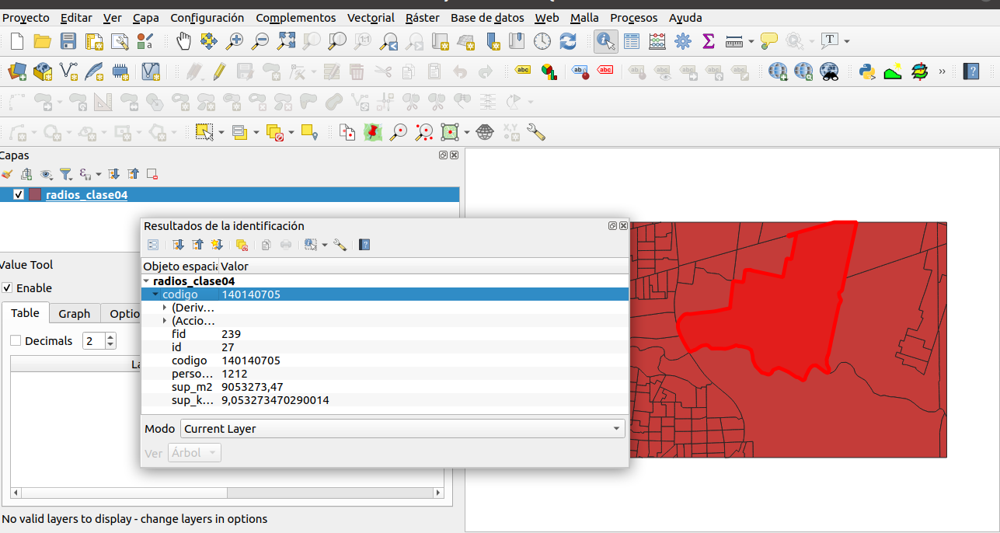

### Ejercicio 1.1:

a) Sobre el Geodataframe de radios, calcular una columna que refleje la densidad de personas por km2.

b) Guardar el Geodataframe modificado como archivo Shapefile y/o como archivo Geopackage y verificar los cambios en QGIS.  

## 2. Superposición de vectores con imágenes

### 2.1. Visualización de datos vectoriales y raster en conjunto

Ahora vamos a continuar trabajando con el vector de radios censales, y lo vamos a superponer con nuestra imagen Sentinel-2.

La imagen Sentinel 2 que hemos preparado para esta notebook contiene 6 bandas:

- Banda 1: Azul
- Banda 2: Verde
- Banda 3: Rojo
- Banda 4: Infrarrojo Cercano (NIR)
- Banda 5: Infrarrojo de Onda Corta 1 (SWIR 1)
- Banda 6: Infrarrojo de Onda Corta 2 (SWIR 2).

Más especificaciones sobre las bandas de Sentinel 2 se pueden encontrar en [este enlace](https://sentinels.copernicus.eu/web/sentinel/user-guides/sentinel-2-msi/resolutions/spatial)

Plotear datos vectoriales y raster por separado en Python es relativamente sencillo. Sin embargo, cuando los queremos ver en conjunto hay que tener en cuenta la extensión espacial (o _extent_ in inglés) que debe ocupar cada uno en la figura. También es importante que las capas tengan la misma proyección (o _CRS_ para Rasterio).

```python
import rasterio
from rasterio import CRS

# Abrir la imagen Sentinel-2
s2 = rasterio.open('data/S2_20180619_2-3-4-8-11-12.tif')
s2_bandas = s2.read()

print('CRS de la imagen:', '\n')
print(s2.crs)
print('CRS de los vectores:', '\n')
print(radios.crs.to_wkt(pretty=True))
```

In [4]:
import rasterio
from rasterio import CRS

# Abrir la imagen Sentinel-2
s2 = rasterio.open('data/S2_20180619_2-3-4-8-11-12.tif')
s2_bandas = s2.read()

print('CRS de la imagen:', '\n')
print(s2.crs)
print('***************************************')
print('CRS de los vectores:', '\n')
print(radios.crs.to_wkt(pretty=True))

CRS de la imagen: 

EPSG:32720
***************************************
CRS de los vectores: 

PROJCRS["POSGAR 2007 / Argentina 4",
    BASEGEOGCRS["POSGAR 2007",
        DATUM["Posiciones Geodesicas Argentinas 2007",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",5340]],
    CONVERSION["Argentina zone 4",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",-90,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-63,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",1,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        PARAMETER["False easting",4500000,
            LENGTHUNIT["metre",1],
           

Como se puede apreciar, `radios` tiene un CRS distinto al de la Sentinel-2. Lo primero que vamos a hacer es reproyectar la capa a `EPSG:32720` usando el método `to_crs()`

```python
radios_32720 = radios.to_crs(32720)
print(radios_32720.crs)
```

In [7]:
radios_32720 = radios.to_crs(s2.crs)
print(radios_32720.crs)

PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]


Las capas ya tienen el mismo CRS. Ahora, para que podamos superponer las dos fuentes de información en el mismo gráfico, debemos explicitar cuál será la extensión a graficar con el parámetro `extent`. Para ello, primero usaremos una función de Rasterio que nos permite obtener esos límites:

```python
from rasterio.plot import plotting_extent
s2_plot_extent = plotting_extent(s2)

print(s2_plot_extent)
```

In [5]:
from rasterio.plot import plotting_extent
s2_plot_extent = plotting_extent(s2)

print(s2_plot_extent)

(388865.786, 399675.3153, 6522120.521, 6528057.4835)


Los valores del _extent_ de nuestra imagen no difieren mucho de lo que nos devuelve **bounds**. Sin embargo, **plot_extent** devuelve una tupla con un orden de coordenadas que Matplotlib puede interpretar correctamente:

```python
print(type(s2.bounds))
print(type(s2_plot_extent))
```

In [12]:
print(type(s2.bounds))
print(type(s2_plot_extent))

<class 'rasterio.coords.BoundingBox'>
<class 'tuple'>


Probemos ahora superponer los radios con una de las bandas de nuestra imagen Sentinel:

```python
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(s2_bandas[0], extent = s2_plot_extent, cmap = 'gray')
radios_32720.plot(ax=ax)
plt.show()
```

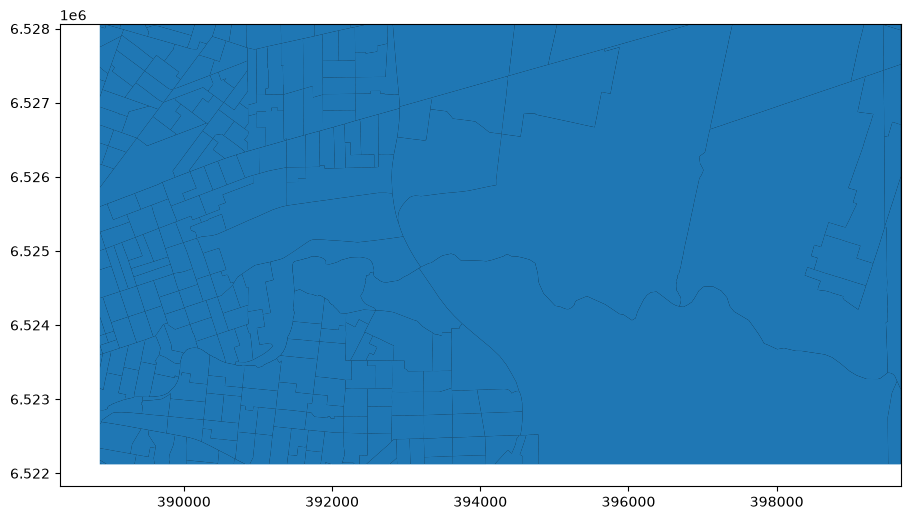

In [13]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(s2_bandas[0], extent = s2_plot_extent, cmap = 'gray')
radios_32720.plot(ax=ax)
plt.show()

Para evitar tener que hacer desaparecer nuestra capa de radios, podemos usar el atributo **boundary** para plotear solo sus bordes, y darles un color que resalte bien con el parámetro **edgecolor**:

```python
fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(s2_bandas[0,:,:], extent = s2_plot_extent, cmap = 'gray')
radios_32720.boundary.plot(ax=ax, edgecolor = 'red')
plt.show()
```

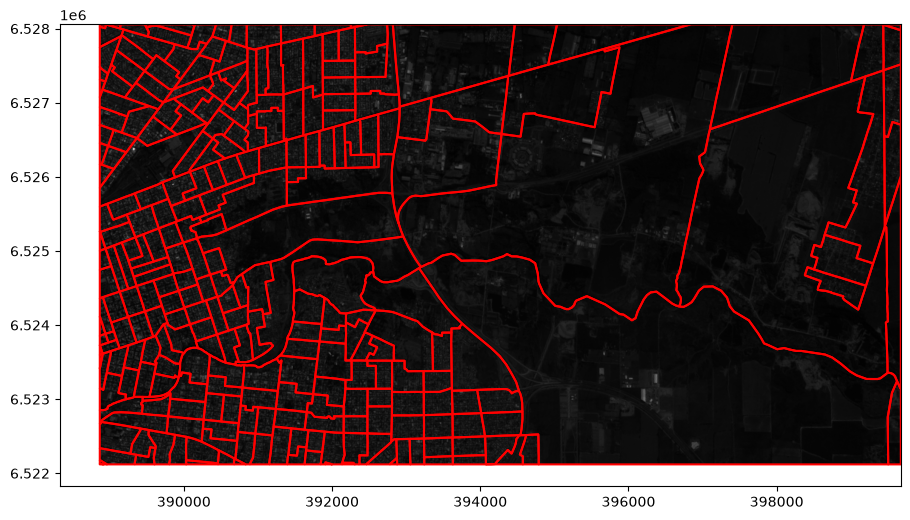

In [14]:
fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(s2_bandas[0,:,:], extent = s2_plot_extent, cmap = 'gray')
radios_32720.boundary.plot(ax=ax, edgecolor = 'red')
plt.show()

In [ ]:
vector_bounds = radios_32720.total_bounds # .total_bounds for overall limits
print(vector_bounds)

[ 388865.62390036 6522119.91168432  399675.15376236 6528056.87450642]


Para que el ploteo se vea más _centrado_, se puede usar `ax.set_xlim` y `ax.set_ylim` y establecer un margen de visualización, en función de las coordenadas máximnas y mínimas de cada capa:

```python
fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(s2_bandas[0,:,:], extent = s2_plot_extent, cmap = 'gray')
radios_32720.boundary.plot(ax=ax, edgecolor = 'red')

# Límites combinados
xmin = min(s2_plot_extent[0], vector_bounds[0])
xmax = max(s2_plot_extent[1], vector_bounds[2])
ymin = min(s2_plot_extent[2], vector_bounds[1])
ymax = max(s2_plot_extent[3], vector_bounds[3])

# Margen visual, por ejemplo 1 % de la extensión
margen_x = (xmax - xmin) * 0.01
margen_y = (ymax - ymin) * 0.01

ax.set_xlim(xmin - margen_x, xmax + margen_x)
ax.set_ylim(ymin - margen_y, ymax + margen_y)

plt.show()
````

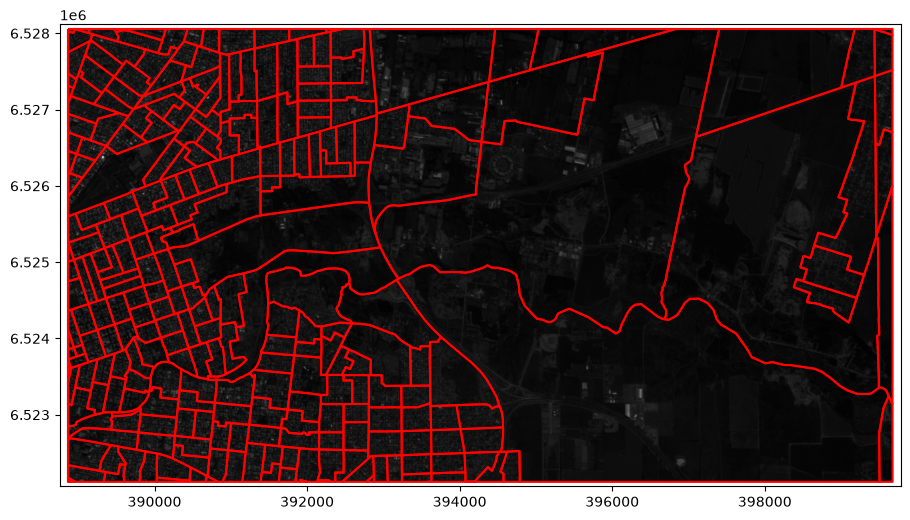

In [13]:
fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(s2_bandas[0,:,:], extent = s2_plot_extent, cmap = 'gray')
radios_32720.boundary.plot(ax=ax, edgecolor = 'red')

# Límites combinados
xmin = min(s2_plot_extent[0], vector_bounds[0])
xmax = max(s2_plot_extent[1], vector_bounds[2])
ymin = min(s2_plot_extent[2], vector_bounds[1])
ymax = max(s2_plot_extent[3], vector_bounds[3])

# Margen visual, por ejemplo 1 % de la extensión
margen_x = (xmax - xmin) * 0.01
margen_y = (ymax - ymin) * 0.01

ax.set_xlim(xmin - margen_x, xmax + margen_x)
ax.set_ylim(ymin - margen_y, ymax + margen_y)

plt.show()

Podemos también superponerlo con un RGB, para lo cual podemos generar primero un stack listo para plotear con `scale_multiband()`, la función que traemos de la Clase 03:

```python
import funciones as fn
rgb = fn.scale_multiband(s2_bandas, p=2)
fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(rgb[[5,3,2]].transpose(1,2,0), extent = s2_plot_extent)
radios_32720.boundary.plot(ax=ax, edgecolor = 'red')
ax.set_title("Combinación bandas S2: 5-3-2")
ax.set_xlim(xmin - margen_x, xmax + margen_x)
ax.set_ylim(ymin - margen_y, ymax + margen_y)
plt.show()
```

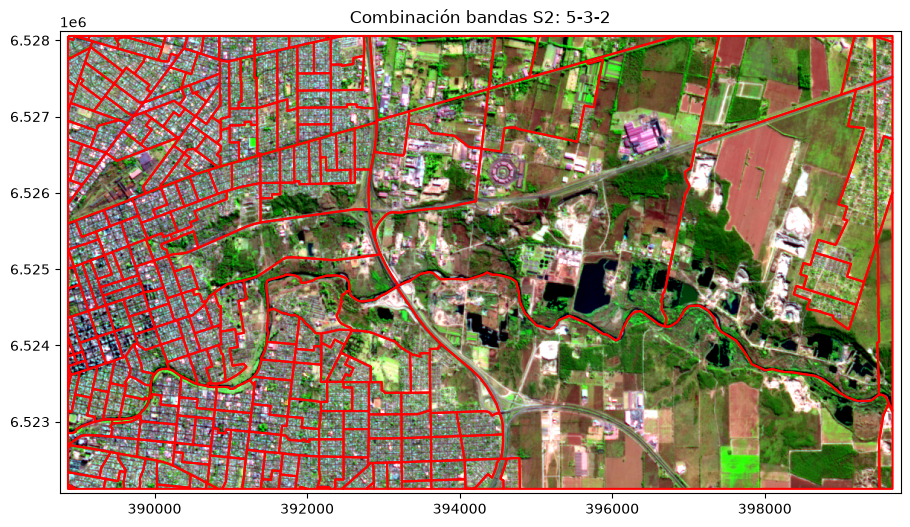

In [14]:
import funciones as fn
rgb = fn.scale_multiband(s2_bandas, p=2)
fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(rgb[[5,3,2]].transpose(1,2,0), extent = s2_plot_extent)
radios_32720.boundary.plot(ax=ax, edgecolor = 'red')
ax.set_title("Combinación bandas S2: 5-3-2")
ax.set_xlim(xmin - margen_x, xmax + margen_x)
ax.set_ylim(ymin - margen_y, ymax + margen_y)
plt.show()

### Ejercicio 2.1

a) Leer los vectores que corresponden al Río Suquía (**data/rio_suquia.shp**) y a red de accesos a Córdoba (**data/red_nacional_recorte**) y graficarlos junto a la imagen Sentinel 2 y los polígonos de radios censales. Revisar el CRS de estas capas y reproyectarlas si es necesario.

**Nota:** Se puede jugar con el parámetro **_zorder_** para cambiar el orden en que se grafican las distintas capas. [Aquí](https://matplotlib.org/stable/gallery/misc/zorder_demo.html) pueden consultar una página específica donde se explica el funcionamiento de este parámetro.

In [ ]:
gpd_suquia = gpd.read_file('data/rio_suquia/rio_suquia.shp')
gpd_rednac = gpd.read_file('data/red_nacional_recorte/red_nacional_recorte.shp')

In [24]:
gpd_suquia.head()

,id,geometry
0,1,"LINESTRING (-64.16929 -31.42351, -64.16845 -31..."


In [22]:
print('Vectores sin reproyectar')
print(f'crs suquia: {gpd_suquia.crs}')
print(f'crs red. nac: {gpd_rednac.crs}')

print('Vectores reproyectados según imagen S2')
suquia_32720 = gpd_suquia.to_crs(s2.crs)
print(suquia_32720.crs)
rednac_32720 = gpd_rednac.to_crs(s2.crs)
print(rednac_32720.crs)

Vectores sin reproyectar
crs suquia: EPSG:4326
crs red. nac: EPSG:4326
Vectores reproyectados según imagen S2
PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]
PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326

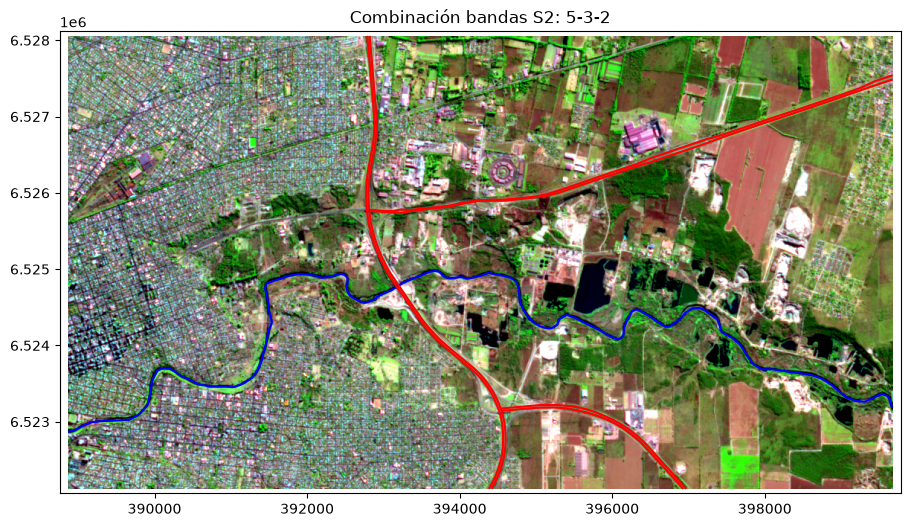

In [26]:
rgb = fn.scale_multiband(s2_bandas, p=2)
fig, ax = plt.subplots(figsize = (12,6))
ax.imshow(rgb[[5,3,2]].transpose(1,2,0), extent = s2_plot_extent)
suquia_32720.plot(ax=ax, edgecolor = 'blue')
rednac_32720.plot(ax=ax, edgecolor = 'red')
ax.set_title("Combinación bandas S2: 5-3-2")
ax.set_xlim(xmin - margen_x, xmax + margen_x)
ax.set_ylim(ymin - margen_y, ymax + margen_y)
plt.show()

### 2.2. Recorte de archivos raster a partir de vectores

En las Clases 02 y 03 vimos una manera de extraer recortes de nuestras imágenes como _subsets_ rectangulares o cuadrados, aplicando el método `read` de Rasterio. Vimos además cómo recalcular el `Transform` de ese recorte para guardarlo correctamente. En esta clase veremos otra manera de hacerlo también con Rasterio, pero utilizando polígonos de nuestros vectores para extraer zonas de la imagen. 

Supongamos que queremos usar el polígono de radio censal resaltado en amarillo en la captura para recortar nuestro raster:

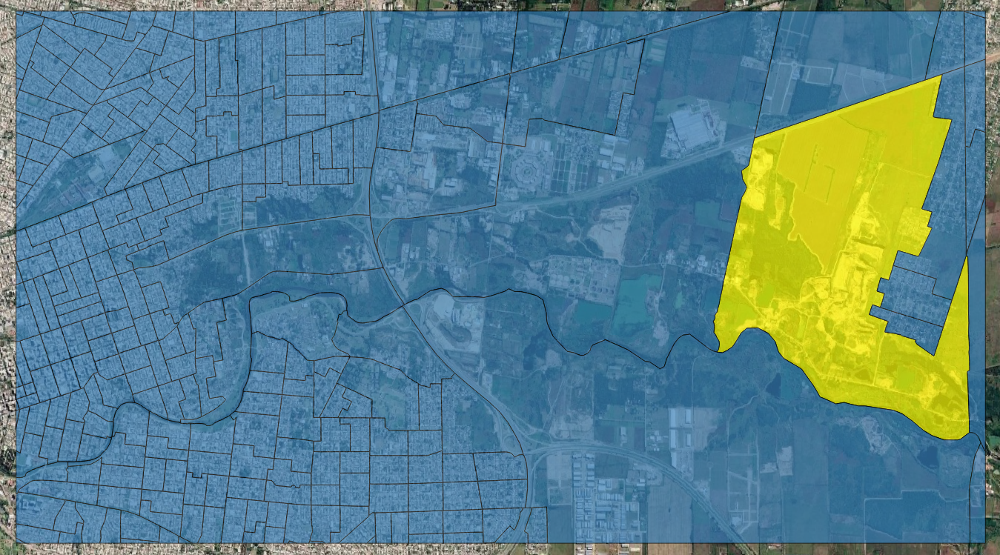

Si consultamos sus atributos en QGIS, ese polígono corresponde al Radio 10, Fracción 07, o al valor '140140710' en la columna **codigo**.

Lo que haremos primero entonces es crear un filtro de nuestro GeoDataframe que contenga solo ese polígono: eso lo podemos hacer a partir de uno de los atributos del mismo:

```python
poligono = radios_32720.loc[radios['codigo'] == '140140710'].copy()
poligono.plot()
```

<Axes: >

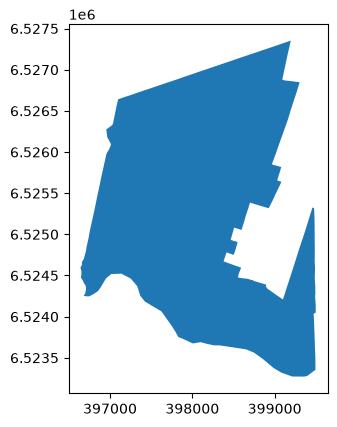

In [27]:
poligono = radios_32720.loc[radios['codigo'] == '140140710'].copy()
poligono.plot()

Ya tenemos nuestro polígono individualizado. Tenemos dos maneras de hacer nuestro _recorte_:

A) Usando la extensión espacial del polígono (con lo cual obtendríamos un rectángulo o cuadrado)

B) Usando los límites exactos del polígono. En ese caso no sería exactamente un recorte, sino una operación en **enmascarado**.

#### 2.2.1. Corte por extensión espacial

En el caso de A, la extensión espacial se refiere siempre al borde o línea que une las coordenadas más extremas en Norte,Sur, Este y Oeste. La siguiente figura (extraída de [esta página](https://www.earthdatascience.org/courses/use-data-open-source-python/intro-raster-data-python/raster-data-processing/crop-raster-data-with-shapefile-in-python/)) lo muestra más claramente para el caso de vectores:

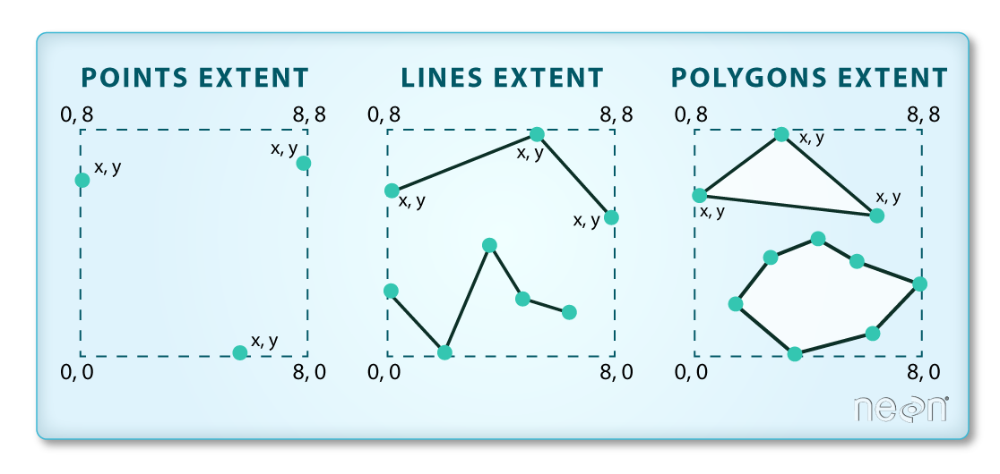

Nuestro polígono tiene su propio _extent_ , definido por las coordenadas que nos da el atributo **_bounds_**:

```python
poligono.bounds
```

In [28]:
poligono.bounds

,minx,miny,maxx,maxy
218,396641.261677,6.523272e+06,399499.569593,6.527354e+06


Podemos crear un polígono a partir de ellas, usando el método **box** de `shapely` (recordar que `shapely` se instala junto a `geopandas`!)

```python
from shapely.geometry import box

extent_geo = gpd.GeoDataFrame(
    geometry=[box(*poligono.total_bounds)],
    crs=poligono.crs
)

#Graficamos el extent junto al polígono:
fig,ax = plt.subplots(figsize = (5,5))
extent_geo.boundary.plot(ax=ax, edgecolor = 'red')
poligono.plot(ax=ax)
plt.show()
```

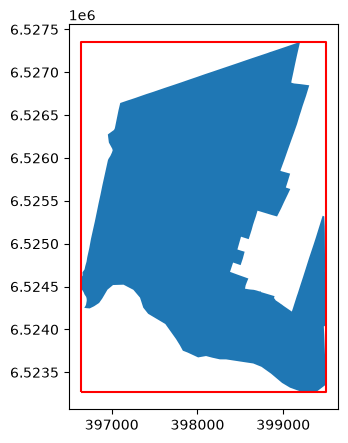

In [29]:
from shapely.geometry import box

extent_geo = gpd.GeoDataFrame(
    geometry=[box(*poligono.total_bounds)],
    crs=poligono.crs
)

#Graficamos el extent junto al polígono:
fig,ax = plt.subplots(figsize = (5,5))
extent_geo.boundary.plot(ax=ax, edgecolor = 'red')
poligono.plot(ax=ax)
plt.show()

¿Qué quiere decir el asterisco `*`que estamos usando en la celda anterior? En este caso el asterisco lo usamos para **desempaquetar** los 4 valores que devuelte `total_bounds`. Es una forma más corta y concisa de hacer:

```python
minx, miny, maxx, maxy = poligono.total_bounds
box(minx, miny, maxx, maxy)
```

El uso del asterisco para desempaquetar es muy útil, y ya lo hemos aplicado en la Clase 03 para desempaquetar la información de los metadatos de una imagen.

Ahora usamos **extent_geo** para hacer el recorte con la función **mask** de Rasterio:

```python
from rasterio.mask import mask
s2_clip, clip_transform = mask(dataset=s2,shapes = extent_geo.geometry, crop = True)

print('Transform original: ', s2.transform)
print('Nuevo transform: ', clip_transform)
print('Dimensiones del recorte', s2_clip.shape)
```

In [30]:
from rasterio.mask import mask
s2_clip, clip_transform = mask(dataset=s2,shapes = extent_geo.geometry, crop = True)

print('Transform original: ', s2.transform)
print('Nuevo transform: ', clip_transform)
print('Dimensiones del recorte', s2_clip.shape)

Transform original:  | 10.00, 0.00, 388865.79|
| 0.00,-9.99, 6528057.48|
| 0.00, 0.00, 1.00|
Nuevo transform:  | 10.00, 0.00, 396635.45|
| 0.00,-9.99, 6527357.84|
| 0.00, 0.00, 1.00|
Dimensiones del recorte (6, 409, 287)


**Mask** nos devuelve el archivo recortado como arreglo de Numpy (lo hemos llamado **s2_clip**) y su _GeoTransform_ ya calculado (lo hemos asignado a la variable **clip_transform**)

```python
minx, miny, maxx, maxy = poligono.total_bounds
plot_extent = (minx, maxx, miny, maxy)
rgb_clip = fn.scale_multiband(s2_clip, p=2)

fig, ax = plt.subplots(figsize = (10,10))
ax.imshow(rgb_clip[[2,1,0]].transpose(1,2,0), extent = plot_extent)
poligono.boundary.plot(ax=ax, edgecolor = 'red')
extent_geo.boundary.plot(ax=ax, edgecolor = 'yellow', linewidth = 3)
ax.set_title("Recorte por Extent \n Combinación bandas S2: 2-1-0")
plt.show()
```

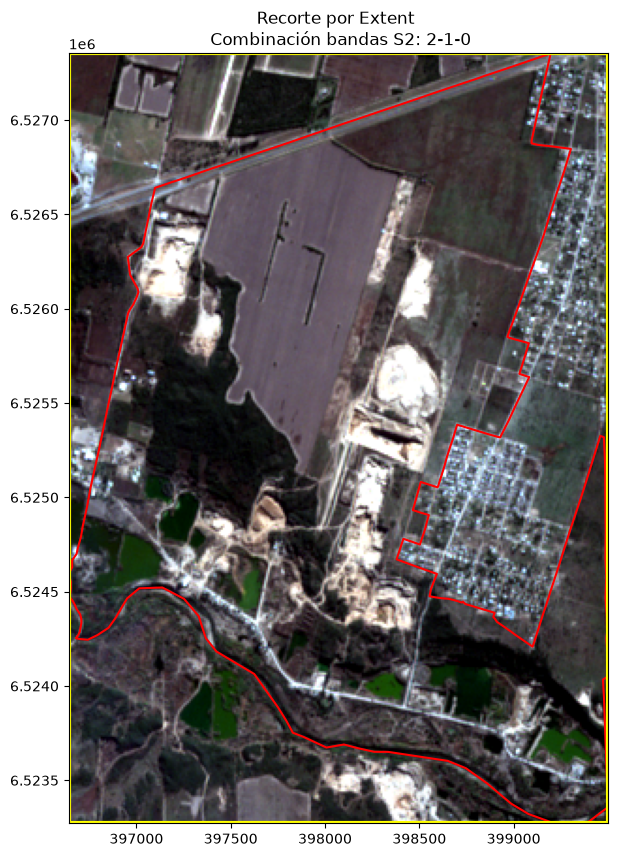

In [31]:
minx, miny, maxx, maxy = poligono.total_bounds
plot_extent = (minx, maxx, miny, maxy)
rgb_clip = fn.scale_multiband(s2_clip, p=2)

fig, ax = plt.subplots(figsize = (10,10))
ax.imshow(rgb_clip[[2,1,0]].transpose(1,2,0), extent = plot_extent)
poligono.boundary.plot(ax=ax, edgecolor = 'red')
extent_geo.boundary.plot(ax=ax, edgecolor = 'yellow', linewidth = 3)
ax.set_title("Recorte por Extent \n Combinación bandas S2: 2-1-0")
plt.show()

#### 2.2.2. Corte por máscara

Veamos ahora como funciona la opción B, es decir recortar haciendo un **enmascarado**.

En este caso, en vez de usar el Extent, directamente usamos los límites exactos de nuestro polígono. El raster resultante **sigue siendo una matriz rectangular**, pero todos los píxeles que caen por fuera de la máscara (el polígono) quedan como valores Sin datos. La geometría que aplicamos ahora es directamente la del Geodataframe **poligono**:

```python
s2_mask, mask_transform = mask(dataset=s2,shapes = poligono.geometry, crop = True)
```

In [32]:
s2_mask, mask_transform = mask(dataset=s2,shapes = poligono.geometry, crop = True)

¿Qué sucederá con los pixeles que serán enmascarados? Esto se maneja con el parámetro _nodata_, que por defecto es _None_. Cuando este parámetro es nulo, _mask_ se fija cuál es el valor definido como NoData en nuestra imagen original. Si no tiene uno definido, asigna como _nodata_ el valor 0:

```python
print(s2.meta['nodata'])
```

In [33]:
print(s2.meta['nodata'])

None


Nuestro GeoTiff no tenía ningun valor de _nodata_ definido. Por lo tanto, el mask rellenó con 0 todos esos valores. Si queremos plotear usando nuestra función **plot_rgb()** debemos pasarle ese parámetro como _nodata_:

```python
plot_extent = (minx,maxx,miny,maxy)
rgb_mask = fn.scale_multiband(s2_mask, p=2, nodata = 0)

fig, ax = plt.subplots(figsize = (10,10))
ax.imshow(rgb_mask[[2,1,0]].transpose(1,2,0), extent = plot_extent)
poligono.boundary.plot(ax=ax, edgecolor = 'red')
extent_geo.boundary.plot(ax=ax, edgecolor = 'yellow')
ax.set_title("Recorte por Máscara\nCombinación bandas S2: 2-1-0")
plt.show()
```

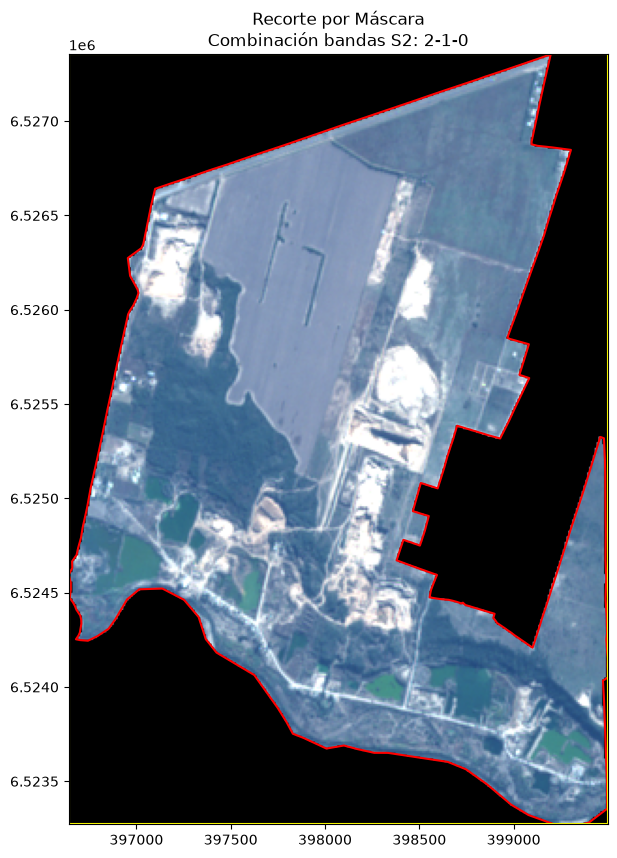

In [38]:
plot_extent = (minx,maxx,miny,maxy)
rgb_mask = fn.scale_multiband(s2_mask, p=2, nodata = s2.meta['nodata'])

fig, ax = plt.subplots(figsize = (10,10))
ax.imshow(rgb_mask[[2,1,0]].transpose(1,2,0), extent = plot_extent)
poligono.boundary.plot(ax=ax, edgecolor = 'red')
extent_geo.boundary.plot(ax=ax, edgecolor = 'yellow')
ax.set_title("Recorte por Máscara\nCombinación bandas S2: 2-1-0")
plt.show()

Esto se ve bastante diferente a **s2_clip** , verdad? Sin embargo, si imprimimos sus dimensiones son exactamente iguales:

```python
print(s2_clip.shape)
print(s2_mask.shape)
```

Lo que cambia es que ahora por afuera de los bordes de la máscara, tenemos todos píxeles con valor 0. Nosotros en realidad querríamos que sean píxeles sin datos, por lo tanto a la hora de guardar el raster recortado, lo vamos a tener que explicitar en sus metadatos.

#### 2.3.Escritura de los recortes en nuestro sistema

Ahora resta guardar estos recortes en nuestro equipo local. Con Rasterio hay que definir un nombre de archivo de salida, y un conjunto de metadatos, donde como vimos en la Clase 03 se definen todas las propiedades que permiten geolocalizar nuestra imagen y superponerla con otras capas.

Lo más "engorroso" es re-definir los metadatos cuando hemos hecho un recorte. Recordemos la información que incluyen:

```python
s2.meta
```

De todos los metadatos de la imagen Sentinel-2 completa, solo debemos cambiar los parámetros 'width' , 'height' y 'transform'. También, y sobretodo para el raster al que le aplicamos la máscara, debemos explicitar que tome al 0 como valor sin datos. Podemos re-definir los metadatos copiando y pegando la salida de arriba, y modificando lo que necesitamos:

```python
recorte_metadata = ({'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0,
 'width': s2_mask.shape[2],
 'height': s2_mask.shape[1],
 'count': s2_mask.shape[0],
 'crs': CRS.from_epsg(32720),
 'transform': mask_transform})
```

In [39]:
recorte_metadata = ({'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0,
 'width': s2_mask.shape[2],
 'height': s2_mask.shape[1],
 'count': s2_mask.shape[0],
 'crs': CRS.from_epsg(32720),
 'transform': mask_transform})

recorte_metadata 

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0,
 'width': 287,
 'height': 409,
 'count': 6,
 'crs': CRS.from_epsg(32720),
 'transform': Affine(9.999564569842732, 0.0, 396635.44767076784,
        0.0, -9.99488636363699, 6527357.841454545)}

Ahora podemos escribir los dos recortes (el extent y el enmascarado):

```python

with rasterio.open('output/Clase04_S2_mask.tif', "w", **recorte_metadata) as dest:
        dest.write(s2_mask)
        
with rasterio.open('output/Clase04_S2_clip.tif', "w", **recorte_metadata) as dest:
        dest.write(s2_clip)
```

In [40]:
with rasterio.open('output/Clase04_S2_mask.tif', "w", **recorte_metadata) as dest:
        dest.write(s2_mask)
        
with rasterio.open('output/Clase04_S2_clip.tif', "w", **recorte_metadata) as dest:
        dest.write(s2_clip)

Podemos abrir los archivos creados en QGIS y corroborar que se hayan hecho bien los recortes:

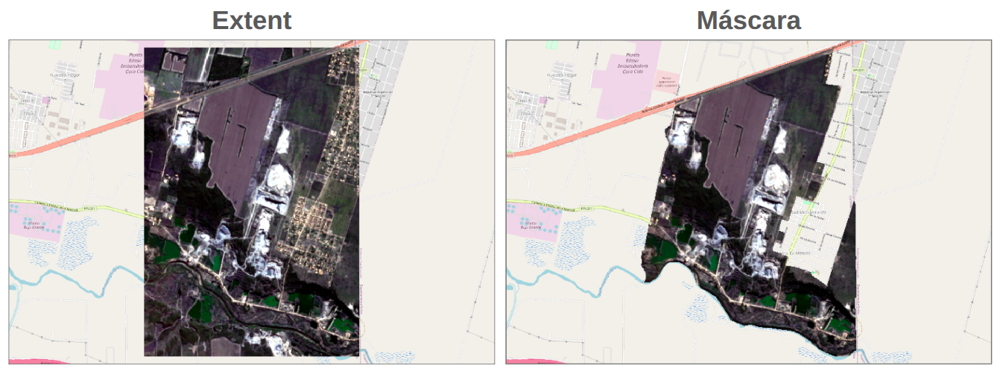

#### 2.4. ¿Qué pasa con los valores 'nodato'?

Como se comentaba más arriba, cuando tenemos píxeles que quedan enmascarados, los cuales rellenamos con 0 en este caso, si queremos que un software de procesmaiento de imágenes los reconozca como tal y los muestre _transparentes_, debemos especificar este valor 0 como `nodata` en los metadatos. Si los dejamos como `None`, entonces el programa interpretará al 0 como un valor más:

```python
mask_metadatos_incorrecto = {'driver': 'GTiff',
                  'dtype': 'uint16',
                  'nodata': None,
                  'width': s2_mask.shape[2],
                  'height': s2_mask.shape[1],
                  'count': 6,
                  'crs': CRS.from_epsg(32720),
                  'transform': mask_transform}

with rasterio.open('output/Clase04_s2_mask_incorrecto.tif', 'w', **mask_metadatos_incorrecto) as dst:
    dst.write(s2_mask)
```


mask_metadatos_incorrecto = {'driver': 'GTiff',
                  'dtype': 'uint16',
                  'nodata': None,
                  'width': s2_mask.shape[2],
                  'height': s2_mask.shape[1],
                  'count': 6,
                  'crs': CRS.from_epsg(32720),
                  'transform': mask_transform}

with rasterio.open('output/Clase04_s2_mask_incorrecto.tif', 'w', **mask_metadatos_incorrecto) as dst:
    dst.write(s2_mask)

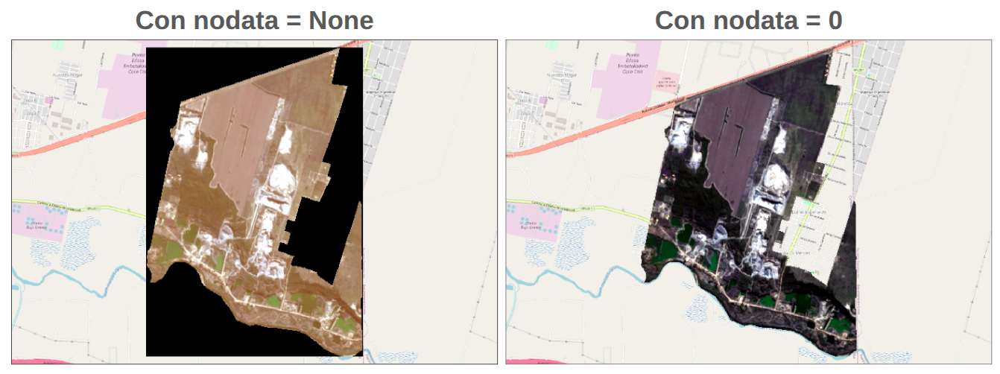

<h3 style="color:red;">Ejercicio 2.2. - Entregable!</h3>

a) Probar qué sucede con el tamaño y extensión espacial de los archivos guardados como GeoTiff cuando en el comando Mask se configura el parámetro **crop** como `False`. Buscar en la documentación de Rasterio a qué se refiere este parámetro.

<h3 style="color:red;">Ejercicio 2.3. - Entregable!</h3>

Buscá la misma escena satelital que procesaste para el ejercicio 2.4 de la Clase 03, ya sea la imagen original o los índices / bandas que generaste luego de hacer esa actividad. Buscá o creá (no tenés que hacerlo en Python, puede ser con las herramientas de SIG que ya uses) un polígono vectorial que te sirva para extraer un sector de esa imagen usando el `mask` de Rasterio. Guardá el nuevo recorte generado definiendo de manera consistente los píxeles con valores sin datos, en caso de corresponder.

## 3. Extra final: Reproyección de archivos raster

### 3.1. Reproyección con `rasterio`

En el caso de los archivos raster, el proceso de reproyección no es tan sencillo como con los vectores, , dado que la implica calcular unas nuevas transformaciones, así como una nueva matriz de datos que posiblemente tendrá un número diferente de filas y columnas. El proceso que vamos a llevar a cabo entonces es el siguiente:

- Calcular los parámetros de geotransformación de la imagen de salida, para lo cual utilizaremos la herramienta [calculate_default_transform](https://rasterio.readthedocs.io/en/latest/api/rasterio.warp.html#rasterio.warp.calculate_default_transform). A esta herramienta le pasaremos los siguientes parámetros:
  - **Sistema de referencia origen**: lo tenemos en los metadatos de la imagen fuente
  - **Sistema de referencia destino**: lo calculamos a partir del EPSG
  - **Dimensiones de la matriz origen**: lo tenemos en los metadatos
  - **Extensión de la capa origen**: lo calculamos a partir de la altura y las transformaciones de la imagen fuente. Para esto utilizamos la herramienta [array_bounds](https://rasterio.readthedocs.io/en/latest/api/rasterio.transform.html) de rasterio. Aquí también podríamos aprovechar la variable **s2_plot_extent** que definimos más arriba, ya que tiene la misma información (aunque en un orden distinto!!!).
  - **Resolución de salida**: lo establecemos nosotros


- Proyectar el array, aquí utilizaremos la herramienta [reproject](https://rasterio.readthedocs.io/en/latest/topics/reproject.html#:~:text=Rasterio%20can%20map%20the%20pixels%20of%20a%20destination,and%20transform.%20This%20process%20is%20known%20as%20reprojection.) de rasterio. Los parámetros necesarios son:
  - Matriz de datos a proyectar
  - Matriz vacía donde escribiremos nuestro resultado
  - Geotransformación origen
  - Sistema de referencia origen
  - Geotransformación de los datos de salida
  - Sistema de referencia destino
  - Valor _no data_ para los datos de salida


- Finalmente, construiremos nuestros metadatos para la nueva imagen teniendo en cuenta los parámetros calculados.

Para el primer paso, necesitamos entonces calcular la extensión de nuestra capa origen, así como definir el sistema de referencia de la capa destino. Esto lo realizamos de la siguiente manera:

```python
from rasterio.crs import CRS
from rasterio.warp import reproject, calculate_default_transform
from rasterio.transform import array_bounds
from rasterio.features import shapes

# Calcular la extensión de la capa:
metadata = s2.meta
src_bounds = array_bounds(metadata['height'], 
                          metadata['width'], 
                          metadata['transform'])

# Establecer el sistema de referencia de destino:
dst_crs = CRS.from_epsg(4326)
```

Ahora sí, podemos calcular las geotransformaciones, así como las dimensiones de nuestra imagen de salida (fijarse en los valores que pasamos dentro de **resolution**):

```python
dst_transform, dst_width, dst_height = calculate_default_transform(metadata['crs'],
                                                                   dst_crs,
                                                                   metadata['width'],
                                                                   metadata['height'],
                                                                   *src_bounds,
                                                                   resolution=(0.0001, 0.0001))
```

El segundo paso consiste en reproyectar nuestra imagen. Para esto ya hemos calculado los parámetros necesarios. Lo único que nos hace falta es definir una matriz vacía donde guardar nuestra imagen resultante. Esto lo podemos realizar de dos maneras:

```python
nbandas = s2_bandas.shape[0] 
s2_4326 = np.zeros((nbandas,dst_height, dst_width),dtype='float32')

```

Una vez definida nuestra matriz de destino, con las nuevas dimensiones, lo siguiente será proyectar los datos:

```python
reproject(source=s2_bandas,
          destination=s2_4326,
          src_transform=metadata['transform'],
          src_crs=metadata['crs'],
          dst_transform=dst_transform,
          dst_crs=dst_crs,
          dst_nodata=metadata['nodata'])
```

Finalmente, vamos a construir nuestros nuevos metadatos:

```python
metadata_4326 = metadata.copy()
metadata_4326['dtype'] = 'float32'
metadata_4326['width'] = dst_width
metadata_4326['height'] = dst_height
metadata_4326['transform'] = dst_transform
metadata_4326['crs'] = dst_crs
#Agregamos explícitamente que 0 sea considerado como nodata:
metadata_4326['nodata'] = 0

print(metadata_4326)
```

Y ahora sí, podemos guardar nuestra matriz reproyectada como GeoTiff:

```python
with rasterio.open('output/Clase04_S2_4326.tif', "w", **metadata_4326) as dest:
        dest.write(s2_4326)
```

### 3.1. Reproyección con `rioxarray` (opcional)

En esta clase utilizamos **Rasterio** para realizar la reproyección paso a paso. Esto permite comprender qué información interviene en el proceso (CRS, transformación afín, dimensiones de salida, resolución, etc.) y cómo funciona internamente la reproyección de un raster.

Sin embargo, si el objetivo es simplemente reproyectar una imagen y continuar con el análisis, la librería **rioxarray** ofrece una interfaz mucho más sencilla.

> **Importante:** `rioxarray` no forma parte de la instalación estándar de Python. Debe instalarse previamente, por ejemplo mediante:
>
> ```bash
> conda install -c conda-forge rioxarray
> ```


Una vez instalada, la misma reproyección realizada en esta sección puede resumirse en unas pocas líneas de código:

```python
import rioxarray as rxr

# Abrir la imagen
s2 = rxr.open_rasterio('data/S2_20180619_2-3-4-8-11-12.tif')

# Reproyectar a WGS84 (EPSG:4326)
s2_4326 = s2.rio.reproject("EPSG:4326")

# Guardar el resultado
s2_4326.rio.to_raster("output/S2_20180619_4326_2.tif")
```

En este caso, **rioxarray** calcula automáticamente la transformación, las nuevas dimensiones de la imagen y actualiza los metadatos necesarios, evitando gran parte del código requerido con Rasterio.

En este curso utilizamos principalmente **Rasterio**, ya que permite comprender mejor el funcionamiento interno de las operaciones sobre imágenes georreferenciadas. No obstante, es útil conocer `rioxarray` como una alternativa más compacta para proyectos futuros.